## Project 5 - Vehicle Detection

**Vehicle Detection Project**

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

### Import Packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import cv2
import math
import os
import glob
import time
import re
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label

# To allow plotting images more than maximum without getting error
plt.rcParams.update({'figure.max_open_warning': 0})

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import imageio
#imageio.plugins.ffmpeg.download()

### Show Images Function

In [2]:
# Function to display two images side by side
def show_images(img1, title1, img2, title2, heatmap1=False, heatmap2=False):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,15))
    if heatmap1 == True:
        ax1.imshow(img2, cmap='hot')
        ax1.axis('off')
    elif len(img1.shape) == 2:
        ax1.imshow(img1, cmap='gray')
        ax1.axis('off')
    else:
        ax1.imshow(img1)
        ax1.axis('off')
    ax1.set_title(title1, fontsize=20)
    
    if heatmap2 == True:
        ax2.imshow(img2, cmap='hot')
        ax2.axis('off')
    elif len(img2.shape) == 2:
        ax2.imshow(img2, cmap='gray')
        ax2.axis('off')
    else:
        ax2.imshow(img2)
        ax2.axis('off')
    ax2.set_title(title2, fontsize=20)

### Save Images Function

In [3]:
# Function to save images in destination folder
def save_images(img, foldername, filename):
    if not os.path.exists('output_images/' + foldername):
        os.makedirs('output_images/' + foldername)
    cv2.imwrite('output_images/'+ foldername + '/' + filename, img)

## Step 1. Load Training Datasets for Vehicle and Non-Vehicle Images

In [4]:
vehicle_images = glob.glob('training_data/vehicles/**/*.png')
non_vehicle_images = glob.glob('training_data/non-vehicles/**/*.png')

print(' Number of training examples for vehicle images     :',len(vehicle_images))
print(' Number of training examples for non-vehicle images :',len(non_vehicle_images))

 Number of training examples for vehicle images     : 8792
 Number of training examples for non-vehicle images : 8968


**Visualize Training Datasets for Vehicle and Non-Vehicle Images**

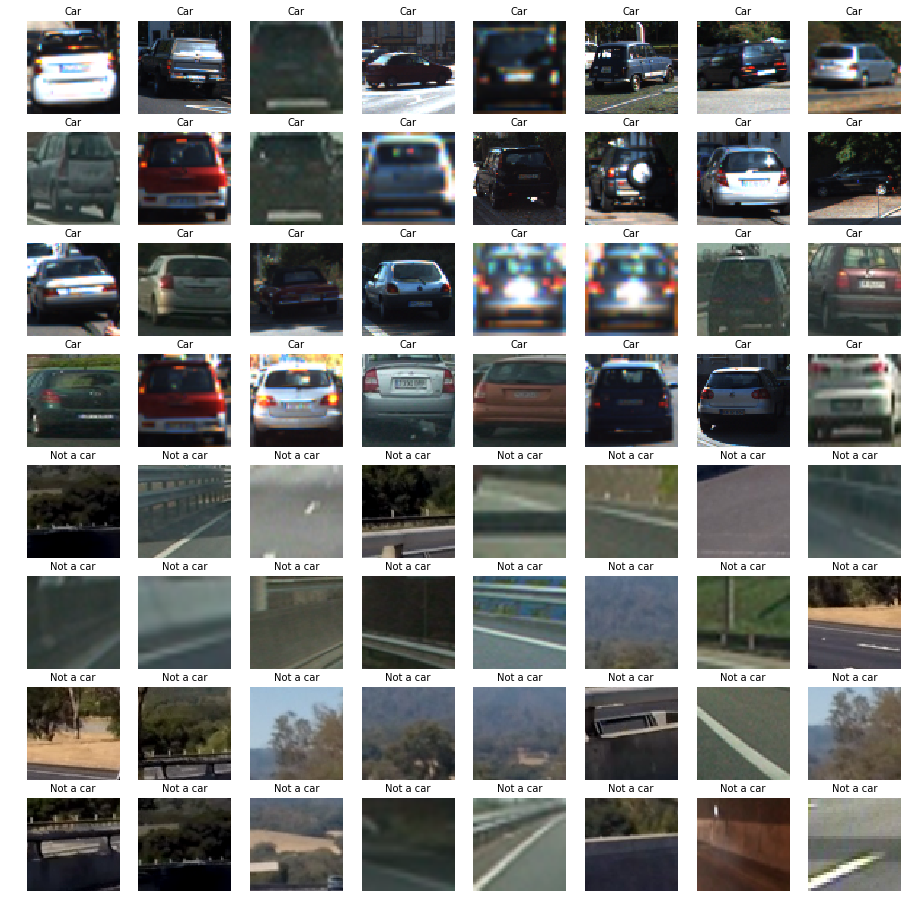

In [5]:
fig, axs = plt.subplots(8,8, figsize=(16, 16))
fig.subplots_adjust(hspace = .2, wspace = .001)
axs = axs.ravel()

# Plot examples of vehicle images
for i in np.arange(32):
    img = cv2.imread(vehicle_images[np.random.randint(0,len(vehicle_images))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('Car', fontsize=10)
    axs[i].imshow(img)

# Plot examples of non-vehicle images
for i in np.arange(32,64):
    img = cv2.imread(non_vehicle_images[np.random.randint(0,len(non_vehicle_images))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('Not a car', fontsize=10)
    axs[i].imshow(img)

## Step 2. Feature Extraction from Vehicle and Non-Vehicle Images

In [11]:
# Load example of vehicle image
veh_indx = np.random.randint(0,len(vehicle_images))
veh_img = cv2.imread(vehicle_images[veh_indx]) #7413

# Load example of non-vehicle image
non_veh_indx = np.random.randint(0,len(non_vehicle_images))
non_veh_img = cv2.imread(non_vehicle_images[non_veh_indx]) #3148

### a) Spatial Binning of Color Features

In [7]:
# Function to compute binned color features
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    spatial_features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return spatial_features

**Visualize Spatial Binning of Colors for Vehicle and Non-Vehicle Images**

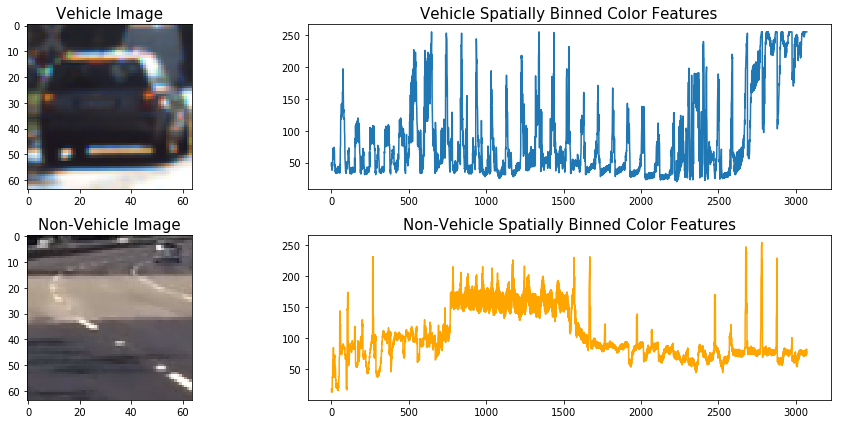

In [95]:
# Extract spatially binned color featuers for vehicle image
veh_feat = bin_spatial(veh_img, size=(32, 32))

# Extract spatially binned color featuers for non-vehicle image
non_veh_feat = bin_spatial(non_veh_img, size=(32, 32))

# Plot spatially binned color featuers for vehicle image
fig = plt.figure(figsize=(14,6))
plt.subplot(221)
plt.imshow(cv2.cvtColor(veh_img, cv2.COLOR_BGR2RGB))
plt.title('Vehicle Image', fontsize=15)
plt.subplot(222)
plt.plot(veh_feat)
plt.title('Vehicle Spatially Binned Color Features', fontsize=15)

# Plot spatially binned color featuers for non-vehicle image
plt.subplot(223)
plt.imshow(cv2.cvtColor(non_veh_img, cv2.COLOR_BGR2RGB))
plt.title('Non-Vehicle Image', fontsize=15)
plt.subplot(224)
plt.plot(non_veh_feat, color='orange')
plt.title('Non-Vehicle Spatially Binned Color Features', fontsize=15)

fig.tight_layout()

### b) Color Histogram Features

In [13]:
# Function to compute color histogram features
def color_hist(img, nbins=32, bins_range=(0, 256), vis=False):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Generating bin centers
    bin_edges = channel1_hist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    if vis == True:
        # Return the individual histograms, bin_centers and feature vector
        return channel1_hist, channel2_hist, channel3_hist, bin_centers, hist_features
    else:
        # Return the feature vector
        return hist_features

**Visualize Color Histogram for Vehicle and Non-Vehicle Images**

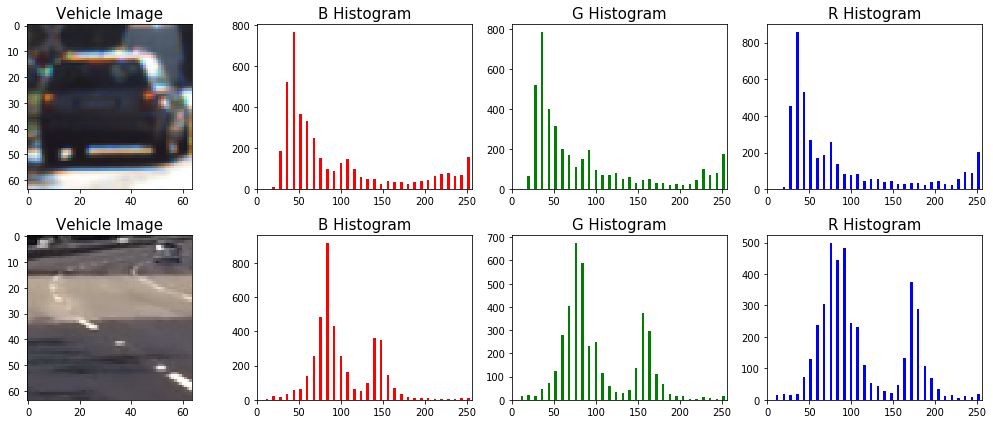

In [88]:
# Extract color histogram features for vehicle image
veh_ch1, veh_ch2, veh_ch3, veh_bincen, veh_feature_vec = color_hist(veh_img, vis=True)

# Extract color histogram features for non-vehicle image
nonveh_ch1, nonveh_ch2, nonveh_ch3, nonveh_bincen, nonveh_feature_vec = color_hist(non_veh_img, vis=True)

fig, axes = plt.subplots(2,4, figsize=(14,6))
fig.subplots_adjust(hspace = .4, wspace=.2)
axes = axes.ravel()

axes[0].imshow(cv2.cvtColor(veh_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Vehicle Image', fontsize=15)
axes[1].bar(veh_bincen, veh_ch1[0], width = 3, color='red')
axes[1].set_xlim(0, 256)
axes[1].set_title('B Histogram', fontsize=15)
axes[2].bar(veh_bincen, veh_ch2[0], width = 3, color='green')
axes[2].set_xlim(0, 256)
axes[2].set_title('G Histogram', fontsize=15)
axes[3].bar(veh_bincen, veh_ch3[0], width = 3, color='blue')
axes[3].set_xlim(0, 256)
axes[3].set_title('R Histogram', fontsize=15)

axes[4].imshow(cv2.cvtColor(non_veh_img, cv2.COLOR_BGR2RGB))
axes[4].set_title('Vehicle Image', fontsize=15)
axes[5].bar(nonveh_bincen, nonveh_ch1[0], width = 3, color='red')
axes[5].set_xlim(0, 256)
axes[5].set_title('B Histogram', fontsize=15)
axes[6].bar(nonveh_bincen, nonveh_ch2[0], width = 3, color='green')
axes[6].set_xlim(0, 256)
axes[6].set_title('G Histogram', fontsize=15)
axes[7].bar(nonveh_bincen, nonveh_ch3[0], width = 3, color='blue')
axes[7].set_xlim(0, 256)
axes[7].set_title('R Histogram', fontsize=15)

fig.tight_layout()

### c) Histogram of Oriented Gradients (HOG) Features

In [15]:
# Function to extract HOG features
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        hog_features, hog_image = hog(img, orientations=orient, 
                                      pixels_per_cell=(pix_per_cell, pix_per_cell),
                                      cells_per_block=(cell_per_block, cell_per_block), 
                                      #block_norm= 'L2-Hys',
                                      transform_sqrt=False, 
                                      visualise=vis, feature_vector=feature_vec)
        return hog_features, hog_image
    # Otherwise call with one output
    else:      
        hog_features = hog(img, orientations=orient, 
                           pixels_per_cell=(pix_per_cell, pix_per_cell),
                           cells_per_block=(cell_per_block, cell_per_block), 
                           #block_norm= 'L2-Hys',
                           transform_sqrt=False, 
                           visualise=vis, feature_vector=feature_vec)
        return hog_features

**Visualize HOG on Vehicle and Non-Vehicle Images**

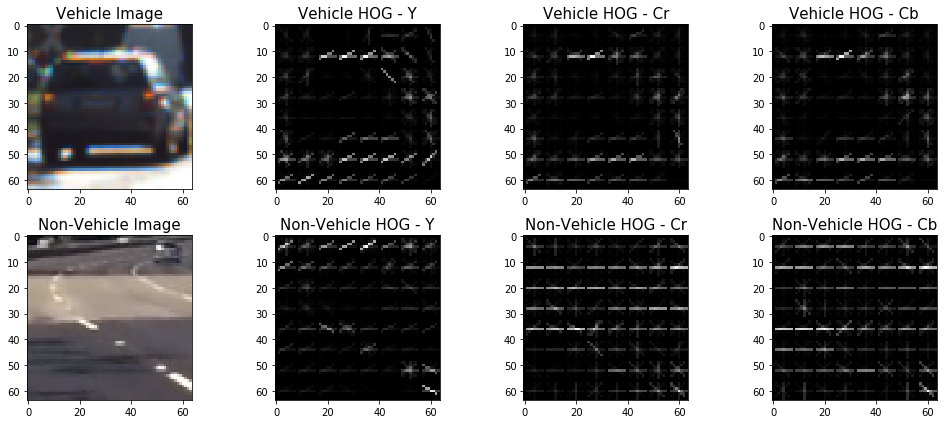

In [89]:
# Extract HOG features for vehicle image
veh_img_cspaced = cv2.cvtColor(veh_img, cv2.COLOR_RGB2YCrCb)
_, veh_hog_ch1 = get_hog_features(veh_img_cspaced[:,:,0], 8, 8, 2, vis=True, feature_vec=True)
_, veh_hog_ch2 = get_hog_features(veh_img_cspaced[:,:,1], 8, 8, 2, vis=True, feature_vec=True)
_, veh_hog_ch3 = get_hog_features(veh_img_cspaced[:,:,2], 8, 8, 2, vis=True, feature_vec=True)

# Extract HOG features for non-vehicle image
non_veh_img_cspaced = cv2.cvtColor(non_veh_img, cv2.COLOR_RGB2YCrCb)
_, non_veh_hog_ch1 = get_hog_features(non_veh_img_cspaced[:,:,0], 8, 8, 2, vis=True, feature_vec=True)
_, non_veh_hog_ch2 = get_hog_features(non_veh_img_cspaced[:,:,1], 8, 8, 2, vis=True, feature_vec=True)
_, non_veh_hog_ch3 = get_hog_features(non_veh_img_cspaced[:,:,2], 8, 8, 2, vis=True, feature_vec=True)

fig, axes = plt.subplots(2,4, figsize=(14,6))
fig.subplots_adjust(hspace = .4, wspace=.2)
axes = axes.ravel()

axes[0].imshow(cv2.cvtColor(veh_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Vehicle Image', fontsize=15)
axes[1].imshow(veh_hog_ch1, cmap='gray')
axes[1].set_title('Vehicle HOG - Y', fontsize=15)
axes[2].imshow(veh_hog_ch2, cmap='gray')
axes[2].set_title('Vehicle HOG - Cr', fontsize=15)
axes[3].imshow(veh_hog_ch3, cmap='gray')
axes[3].set_title('Vehicle HOG - Cb', fontsize=15)

axes[4].imshow(cv2.cvtColor(non_veh_img, cv2.COLOR_BGR2RGB))
axes[4].set_title('Non-Vehicle Image', fontsize=15)
axes[5].imshow(non_veh_hog_ch1, cmap='gray')
axes[5].set_title('Non-Vehicle HOG - Y', fontsize=15)
axes[6].imshow(non_veh_hog_ch2, cmap='gray')
axes[6].set_title('Non-Vehicle HOG - Cr', fontsize=15)
axes[7].imshow(non_veh_hog_ch3, cmap='gray')
axes[7].set_title('Non-Vehicle HOG - Cb', fontsize=15)

plt.tight_layout()

### d) Function to Extract Features from a list of Vehicle and Non-Vehicle Images

In [17]:
# Function to extract features from a list of images
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32), hist_bins=32,
                     orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=False, hist_feat=False, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # Apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel],
                                                orient, pix_per_cell, cell_per_block,
                                                vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
            
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

**Feature Extraction Parameters**

In [ ]:
# color_space = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
# spatial_size = (16, 16) # Spatial binning dimensions
# hist_bins = 32 # Number of histogram bins
# orient = 8 # HOG orientations
# pix_per_cell = 8 # HOG pixels per cell
# cell_per_block = 2 # HOG cells per block
# hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
# spatial_feat = True # Spatial features on or off
# hist_feat = True # Histogram features on or off
# hog_feat = True # HOG features on or off

In [32]:
color_space = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
spatial_size = None # Spatial binning dimensions
hist_bins = None # Number of histogram bins
orient = 11 # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_feat = False # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off

### e) Extract Features from a list of Vehicle and Non-Vehicle Images

In [33]:
t1 = time.time()

car_features = extract_features(vehicle_images, color_space=color_space, spatial_size=spatial_size,
                                hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell,
                                cell_per_block=cell_per_block, hog_channel=hog_channel,
                                spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

notcar_features = extract_features(non_vehicle_images, color_space=color_space, spatial_size=spatial_size,
                                   hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell,
                                   cell_per_block=cell_per_block, hog_channel=hog_channel,
                                   spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

t2 = time.time()
print(round(t2-t1, 2),
      'seconds to extract features from Vehicle and Non-Vehicle Images Training Datasets\n')

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Fit a per-column scaler - if combining different types of features (HOG + color histogram / spatial bining)
if spatial_feat == True or hist_feat == True:
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
else:
    X_scaler = None
    
# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
if spatial_feat == True or hist_feat == True:
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)
else:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)

print('Using the following parameters:\n', color_space, 'Color Space\n', spatial_size, 'Spatial Bin Size\n',
      hist_bins, 'Histogram Bin Size\n', orient, 'Orientations\n', pix_per_cell, 'Pixels per Cell\n',
      cell_per_block,'Cells per Block\n')
print('Feature vector length:', len(X_train[0]))

51.15 seconds to extract features from Vehicle and Non-Vehicle Images Training Datasets

Using the following parameters:
 YUV Color Space
 None Spatial Bin Size
 None Histogram Bin Size
 11 Orientations
 16 Pixels per Cell
 2 Cells per Block

Feature vector length: 1188


## Step 3: Train the Classifier
Using Support Vector Machines (SVM) as a classifier that works well with Hog features.

In [34]:
# Use a linear SVC
svc = LinearSVC()

# Check the training time for the SVC
t1 = time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t1, 2), 'seconds to train SVM Classifier\n')

# Check the score of the SVC
print('Test Accuracy of SVM Classifier = ', round(svc.score(X_test, y_test), 4)*100, '%\n')

# Check the prediction time for a single sample
t1 = time.time()
n_predict = 10
print('For these',n_predict, 'labels        :', y_test[0:n_predict])
print('My SVM Classifier predicts :', svc.predict(X_test[0:n_predict]))
t2 = time.time()
print('')
print(round(t2-t1, 5), 'seconds to predict', n_predict,'labels with SVM Classifier')

1.58 seconds to train SVM Classifier

Test Accuracy of SVM Classifier =  98.31 %

For these 10 labels        : [ 1.  1.  0.  1.  0.  1.  0.  1.  0.  0.]
My SVM Classifier predicts : [ 1.  1.  0.  1.  0.  1.  0.  1.  0.  0.]

0.025 seconds to predict 10 labels with SVM Classifier


## Step 4: Define All Functions for Vehicle Detection

### 1) Sliding Window Implementation
What size window you want to search, where in the image you want to start and stop your search, and how much you want windows to overlap.

This step contains separate functions to determine number of windows, extract features, and sliding window search to make predictions.

### a) Determine Number of Windows

In [21]:
# Function that takes an image, start and stop positions in both x and y,
# window size (x and y dimensions), and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

### b) Function to Extract Features from an Image Window

In [22]:
# Function to extract features from a single image window
def single_img_features(img, color_space='RGB', spatial_size=(32, 32), hist_bins=32,
                        orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=False, hist_feat=False, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

### c) Sliding Window Search

In [23]:
# Function that takes an image and the list of windows to be searched (output of slide_window())
def search_windows(img, windows, clf, scaler, color_space='RGB', spatial_size=(32, 32), hist_bins=32, 
                   orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                   spatial_feat=False, hist_feat=False, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space, spatial_size, hist_bins, 
                                       orient, pix_per_cell, cell_per_block, hog_channel,
                                       spatial_feat, hist_feat, hog_feat)
        
        #5) Scale extracted features to be fed to classifier
        if spatial_feat == False and hist_feat == False:
            test_features = np.array(features).reshape(1, -1)
        else:
            test_features = scaler.transform(np.array(features).reshape(1, -1))

        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    
    #8) Return windows for positive detections
    return on_windows

### d) Draw Boxes

In [24]:
# Function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

### 2) Hog Sub-Sampling Window Search
A more efficient method for the sliding window approach is to extract the Hog features only once for each of a small set of predetermined window sizes (defined by a scale argument), and then can be sub-sampled to get all of its overlaying windows.

The code below defines a single function `find_cars` that is able to both extract features and make predictions.

In [25]:
# A single function to extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler,
              color_space='RGB', spatial_size=(32, 32), hist_bins=32,
              orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
              spatial_feat=False, hist_feat=False):
    
    # array of rectangles where cars were detected
    windows = []
    
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    
    # Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(image)
    
    # Rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            if spatial_feat == True:
                spatial_features = bin_spatial(subimg, size=spatial_size)
            if hist_feat == True:
                hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            if spatial_feat == False and hist_feat == False:
                test_features = np.hstack((hog_features)).reshape(1, -1)
            elif spatial_feat == True and hist_feat == False:
                test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1))
            elif spatial_feat == False and hist_feat == True:
                test_features = X_scaler.transform(np.hstack((hist_features, hog_features)).reshape(1, -1))
            else:
                test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                windows.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    
    # Return windows for positive detections
    return windows

### 3) Heatmap
Build a heatmap from the detections in order to combine overlapping detections and remove false positives.

In [26]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

### 4) Apply Heatmap Threshold
Reject areas affected by false positives by imposing a threshold on heatmap images.

In [27]:
def apply_threshold(heatmap, threshold):
    heatmap_copy = np.copy(heatmap)
    # Zero out pixels below the threshold
    heatmap_copy[heatmap_copy <= threshold] = 0
    # Return thresholded map
    return heatmap_copy

### 5) Apply SciPy Labels to Heatmap and Draw Bounding Boxes for Lables
`label()` function from `scipy.ndimage.measurements` helps to figure out how many cars are there in each frame and which pixels belong to which cars.

In [28]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        
        # Label each detected car
        font = cv2.FONT_HERSHEY_DUPLEX
        text = 'Car' + '{}'.format(car_number)
        cv2.putText(img, text, (((bbox[0][0]+bbox[1][0])//2)-40,bbox[0][1]-20), font, 1, (200,255,155), 4, cv2.LINE_AA)
    
    # Return the image
    return img

## Step 5: Apply Functions on Test Images for Vehicle Detection

In [29]:
# Load and make a list of all test images
test_images = sorted(glob.glob('test_images/*.jpg'))

### 1) First... Try the Sliding Window Implementation

**Visualize Windows Detected**

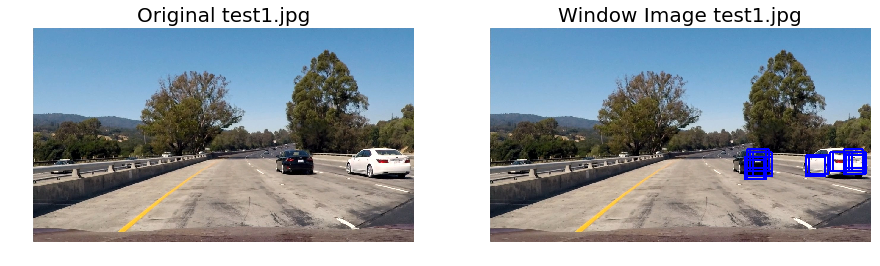

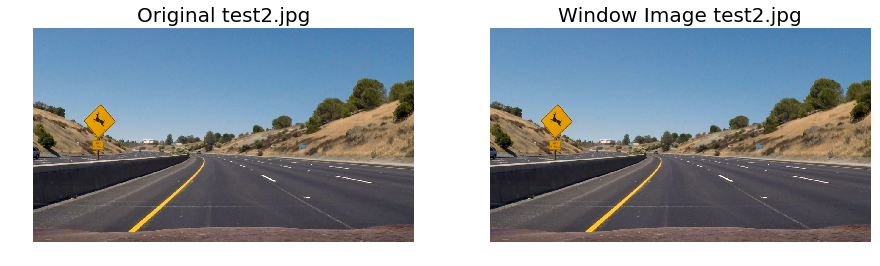

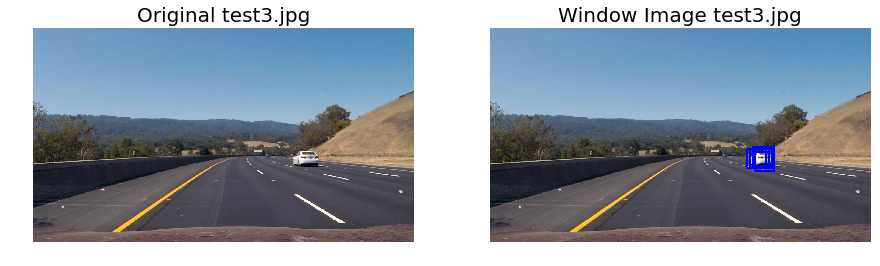

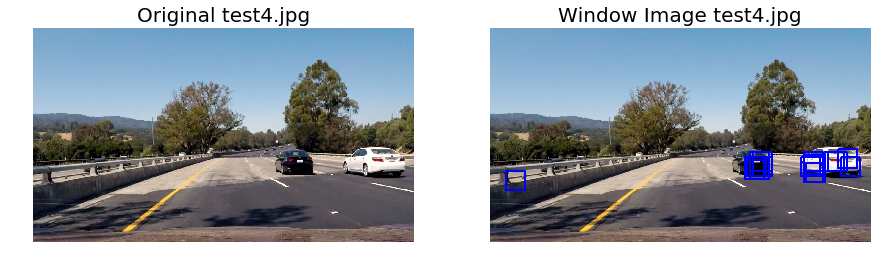

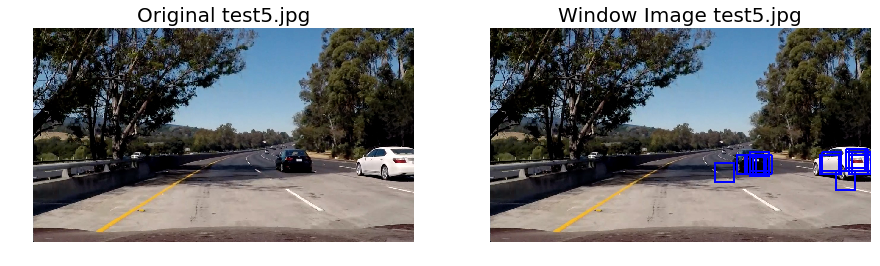

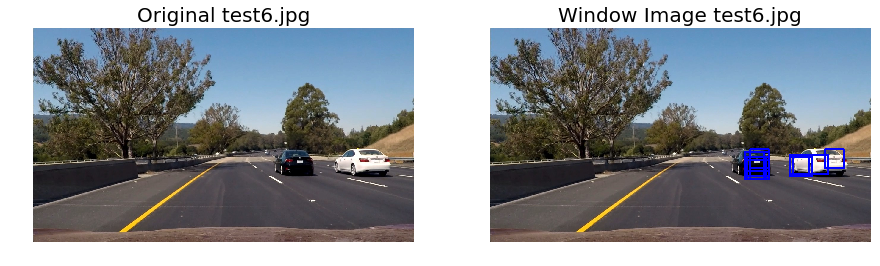

In [30]:
y_start_stop = [400, 700] # Min and max in y to search in slide_window()
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)

    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                           xy_window=(64, 64), xy_overlap=(0.85, 0.85))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space, 
                                 spatial_size, hist_bins, orient, pix_per_cell, 
                                 cell_per_block, hog_channel, spatial_feat, 
                                 hist_feat, hog_feat)

    window_img = draw_boxes(image, hot_windows, color=(0, 0, 255), thick=6)
    
    show_images(image, 'Original '+ filename, window_img, 'Window Image '+ filename)

**Visualize Vehicles Detected**


              In test1.jpg   In test2.jpg   In test3.jpg   In test4.jpg   In test5.jpg   In test6.jpg   
              ------------   ------------   ------------   ------------   ------------   ------------   
              2 cars found   0 cars found   1 car found    3 cars found   3 cars found   2 cars found   

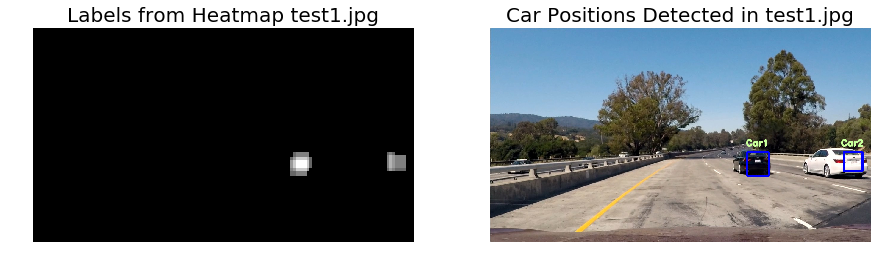

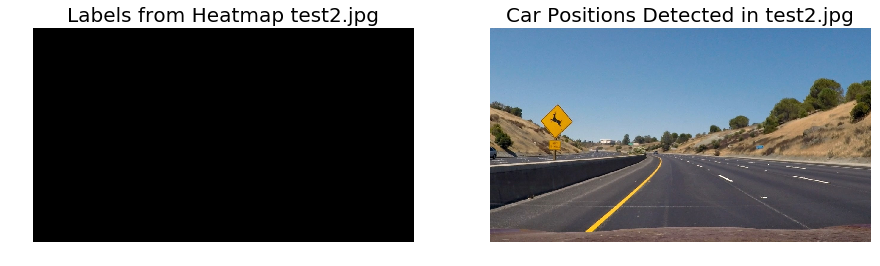

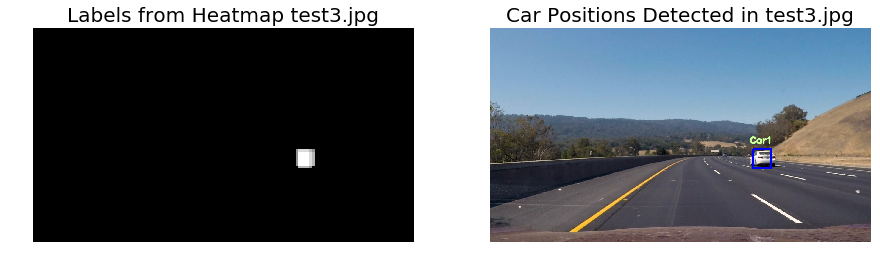

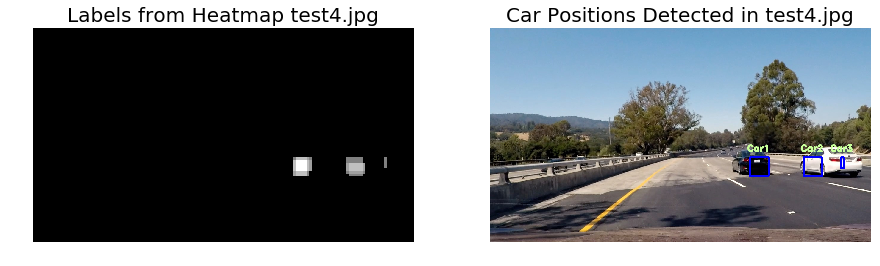

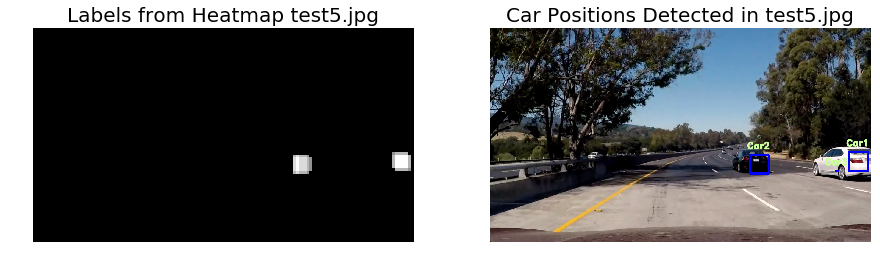

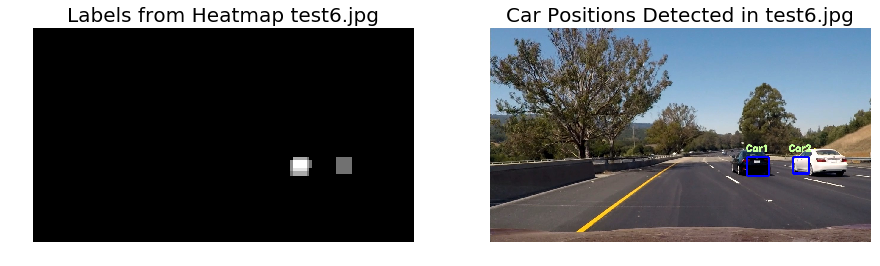

In [31]:
y_start_stop = [400, 700] # Min and max in y to search in slide_window()

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    print('In', filename, end="   ")

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    print('------------', end="   ")

print()
print('             ', end=" ")

for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)

    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                           xy_window=(64, 64), xy_overlap=(0.85, 0.85))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space, 
                                 spatial_size, hist_bins, orient, pix_per_cell, 
                                 cell_per_block, hog_channel, spatial_feat, 
                                 hist_feat, hog_feat)
    
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    heatmap_img = add_heat(heatmap_img, hot_windows)
    heatmap_thrsh_img = apply_threshold(heatmap_img, 3)
    labels = label(heatmap_thrsh_img)
    if ((labels[1]) != 1):
        print(labels[1], 'cars found', end="   ")
    else:
        print(labels[1], 'car found ', end="   ")
    
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    show_images(heatmap_thrsh_img, 'Labels from Heatmap '+ filename, draw_img, 'Car Positions Detected in '+ filename)

### 2) a) Next... Visualize Hog Sub-Sampling Window Search on Test Images

**Visualize Windows Detected**

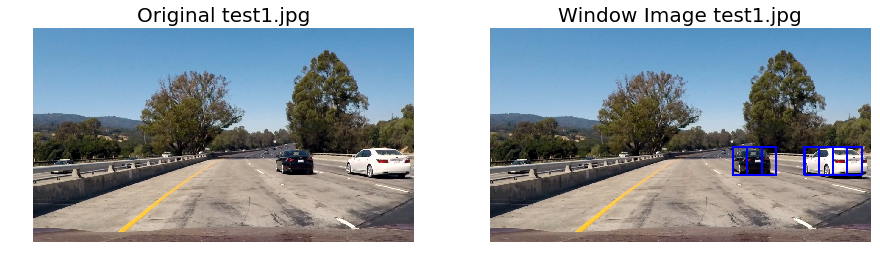

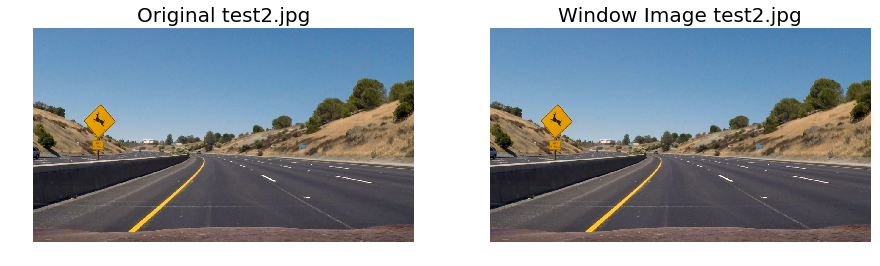

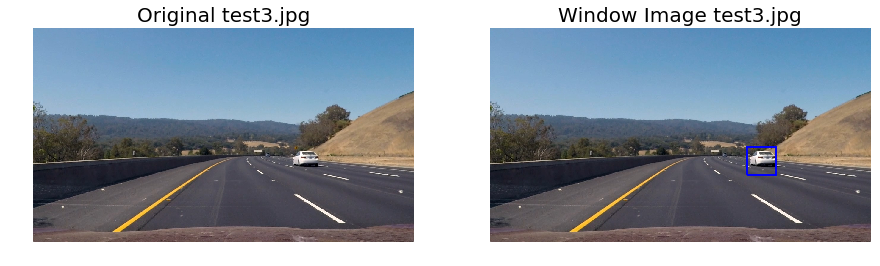

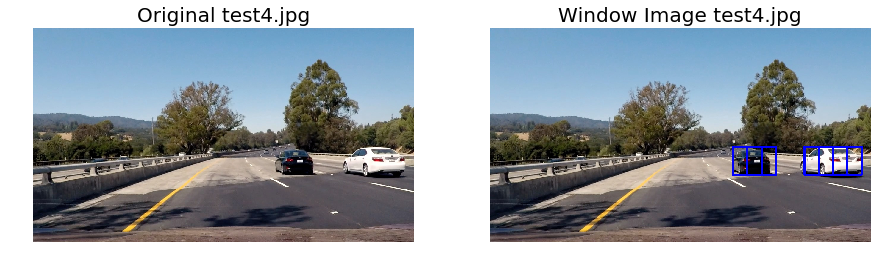

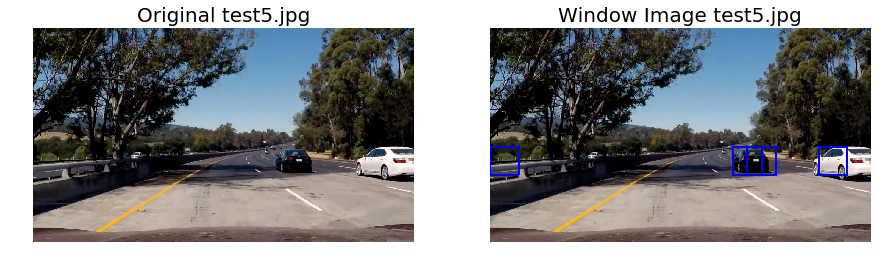

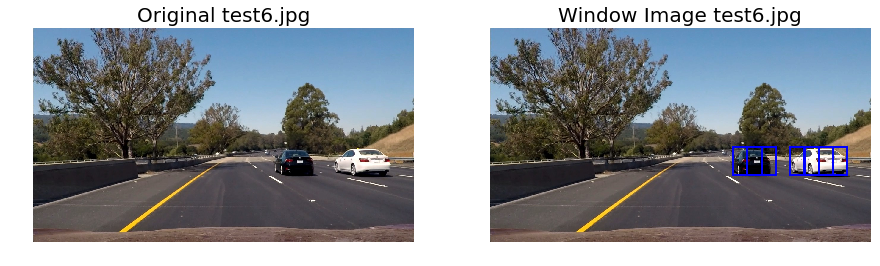

In [35]:
ystart = 400
ystop = 656
scale = 1.5

for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)

    windows = find_cars(image, ystart, ystop, scale, svc, X_scaler, color_space,
                        spatial_size, hist_bins, orient, pix_per_cell,
                        cell_per_block, hog_channel, spatial_feat, hist_feat)
    
    window_img = draw_boxes(image, windows)
    
    show_images(image, 'Original '+ filename, window_img, 'Window Image '+ filename)

**Visualize Vehicles Detected**


              In test1.jpg   In test2.jpg   In test3.jpg   In test4.jpg   In test5.jpg   In test6.jpg   
              ------------   ------------   ------------   ------------   ------------   ------------   
              2 cars found   0 cars found   0 cars found   2 cars found   1 car found    2 cars found   

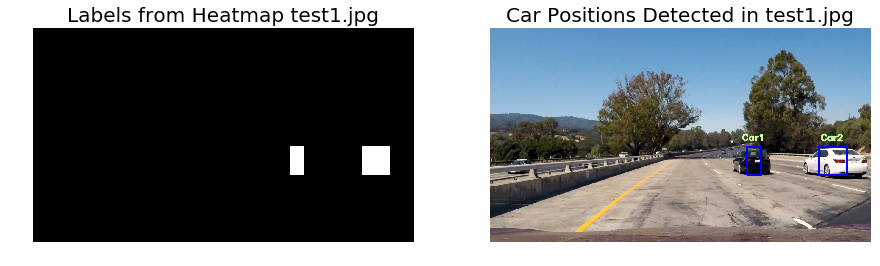

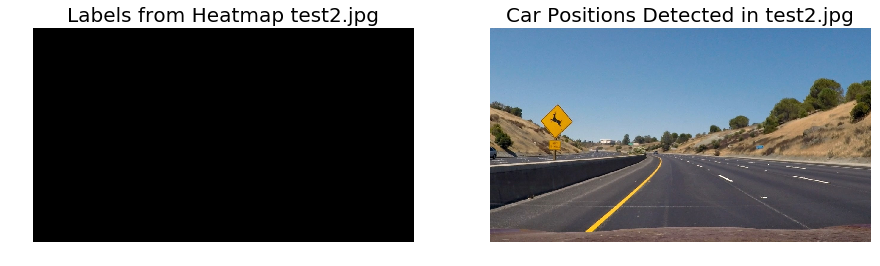

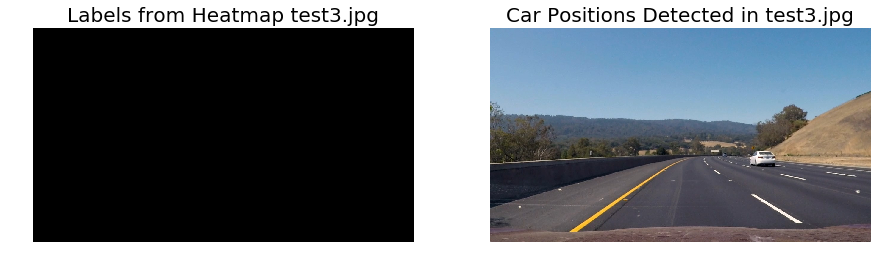

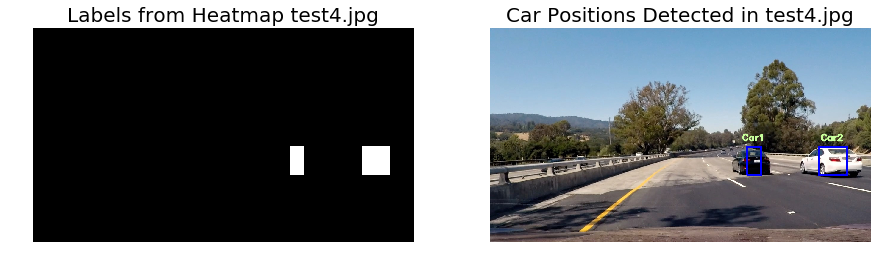

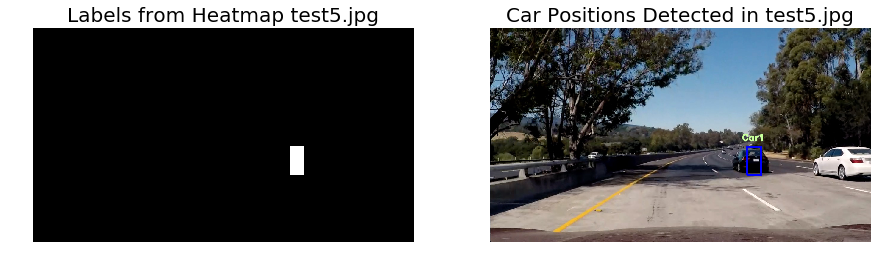

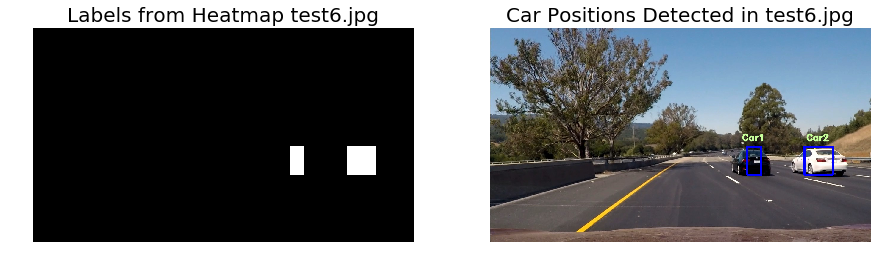

In [36]:
ystart = 400
ystop = 656
scale = 1.5

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    print('In', filename, end="   ")

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    print('------------', end="   ")

print()
print('             ', end=" ")

for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    windows = find_cars(image, ystart, ystop, scale, svc, X_scaler,
                        color_space, spatial_size, hist_bins, orient, pix_per_cell,
                        cell_per_block, hog_channel, spatial_feat, hist_feat)
    
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    heatmap_img = add_heat(heatmap_img, windows)
    heatmap_thrsh_img = apply_threshold(heatmap_img, 1)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmap_thrsh_img, 0, 255)
    labels = label(heatmap)
    if ((labels[1]) != 1):
        print(labels[1], 'cars found', end="   ")
    else:
        print(labels[1], 'car found ', end="   ")
    
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    show_images(heatmap, 'Labels from Heatmap '+ filename, draw_img, 'Car Positions Detected in '+ filename)

### 2) b) Finally... Implement Hog Sub-Sampling Combined with Various Sliding Window Searches on Test Images

**Visualize Windows Detected**

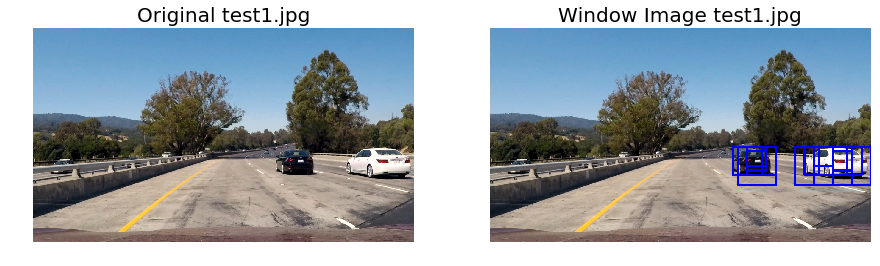

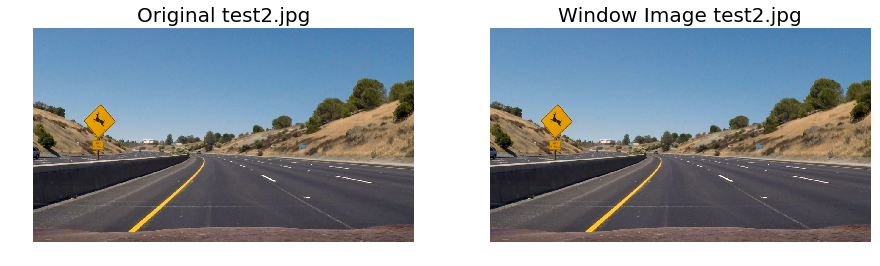

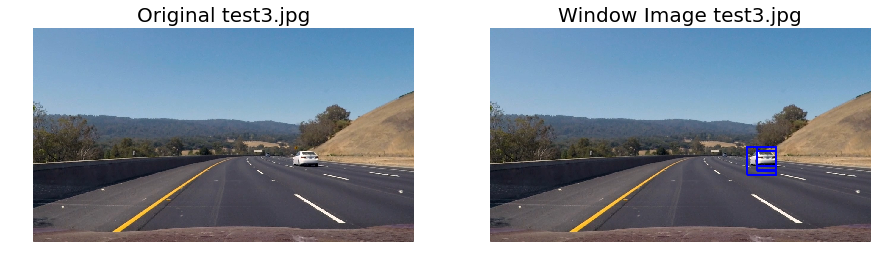

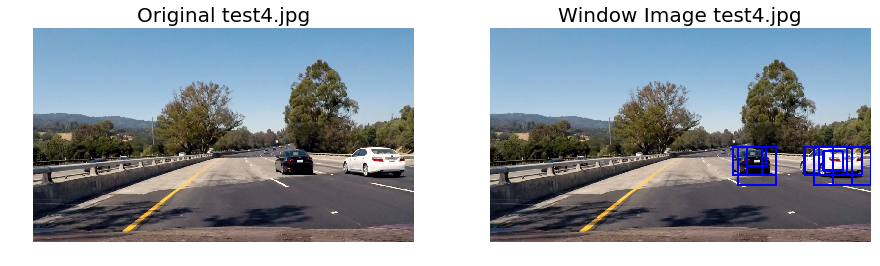

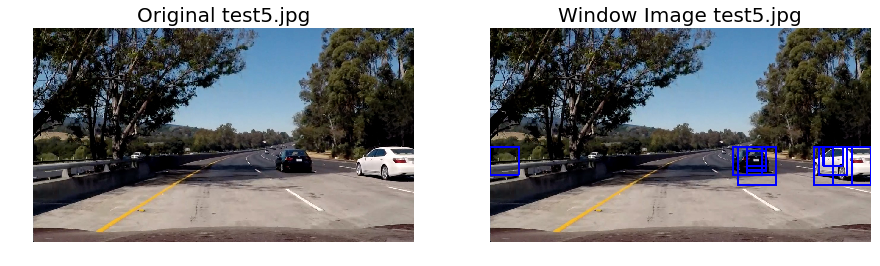

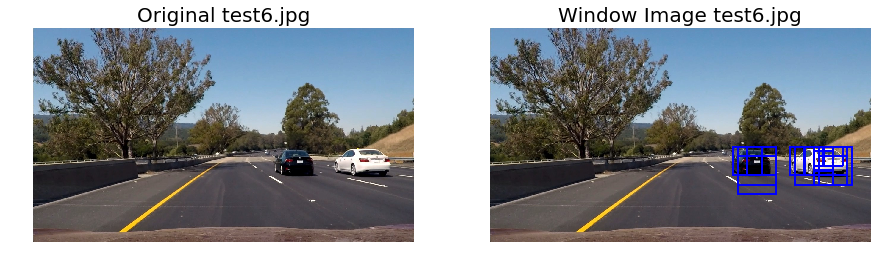

In [99]:
ystart = [400, 416, 400, 432, 400, 432, 400, 464]
ystop  = [464, 480, 496, 528, 528, 560, 596, 660]
scale  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.5, 3.5]

for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)

    windows = []

    for i in range(len(ystart)):
        windows.append(find_cars(image, ystart[i], ystop[i], scale[i], svc, X_scaler,
                                 color_space, spatial_size, hist_bins, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_feat, hist_feat))
    
    windows = [item for sublist in windows for item in sublist]
    
    window_img = draw_boxes(image, windows)
    
    show_images(image, 'Original '+ filename, window_img, 'Window Image '+ filename)
    save_images(cv2.cvtColor(window_img, cv2.COLOR_RGB2BGR), '1_Windows_Detected', filename)

### 3) Visualize Heatmap on Windows Detected Test Images

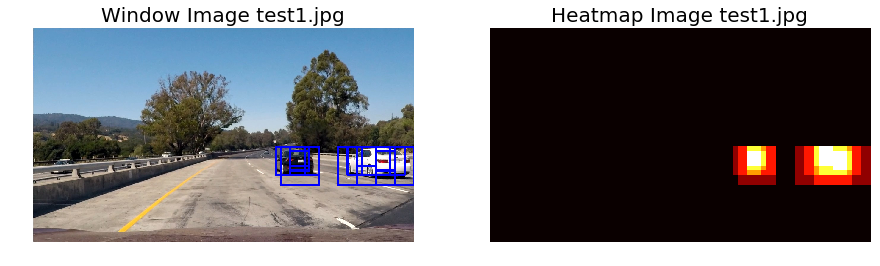

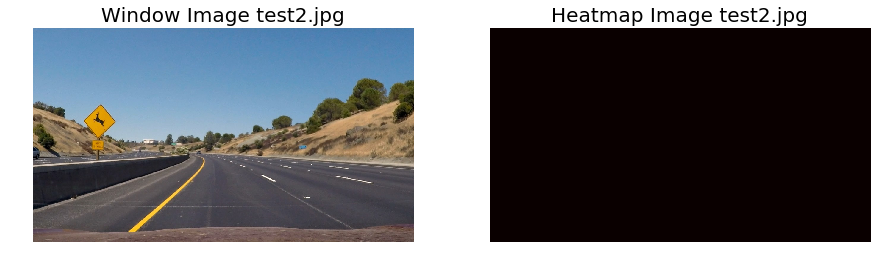

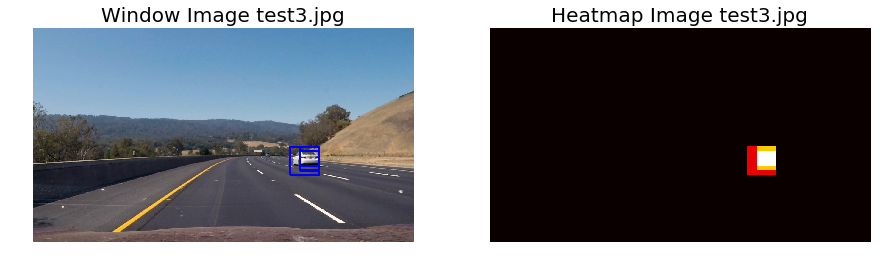

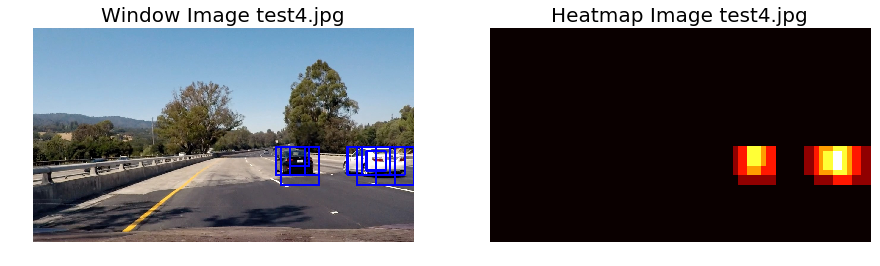

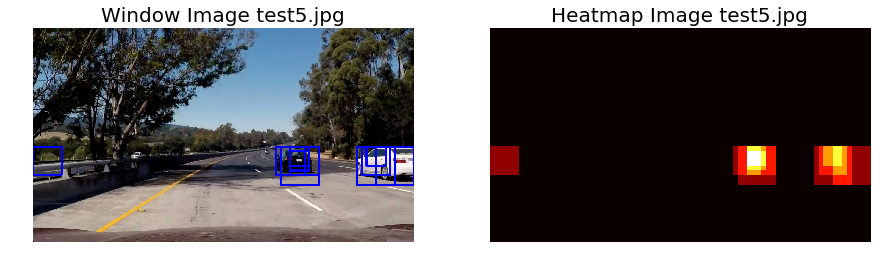

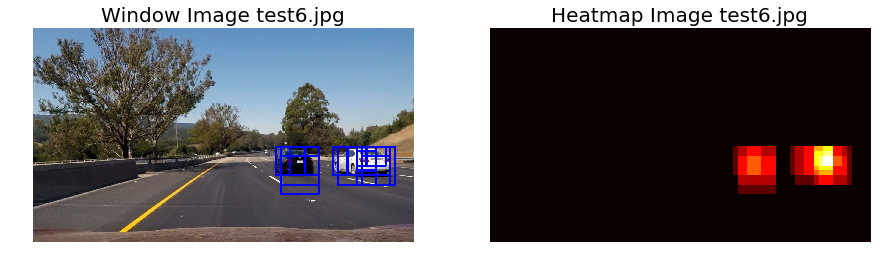

In [98]:
ystart = [400, 416, 400, 432, 400, 432, 400, 464]
ystop  = [464, 480, 496, 528, 528, 560, 596, 660]
scale  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.5, 3.5]

for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    windows = []

    for i in range(len(ystart)):
        windows.append(find_cars(image, ystart[i], ystop[i], scale[i], svc, X_scaler,
                                 color_space, spatial_size, hist_bins, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_feat, hist_feat))
    
    windows = [item for sublist in windows for item in sublist]

    window_img = draw_boxes(image, windows)
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    heatmap_img = add_heat(heatmap_img, windows)
    
    show_images(window_img, 'Window Image '+ filename, heatmap_img, 'Heatmap Image '+ filename, False, True)

### 4) Visualize Heatmap Threshold on Windows Detected Test Images

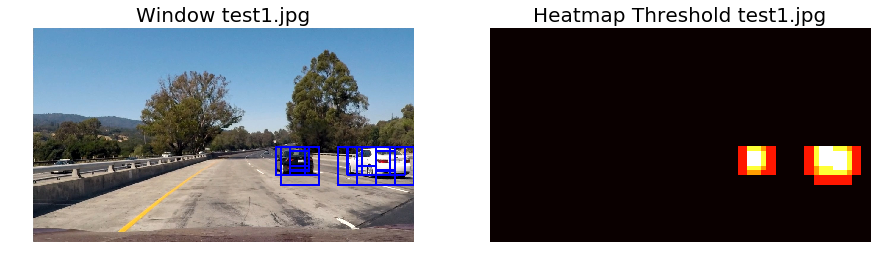

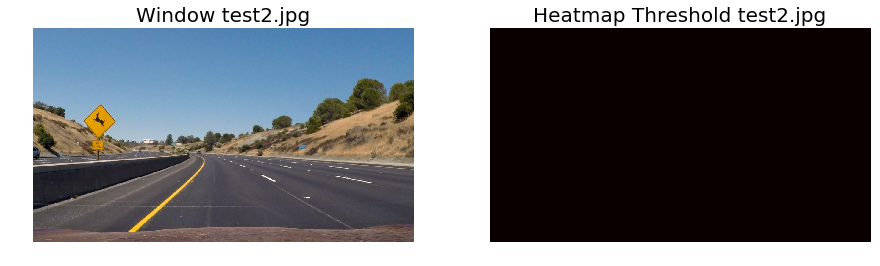

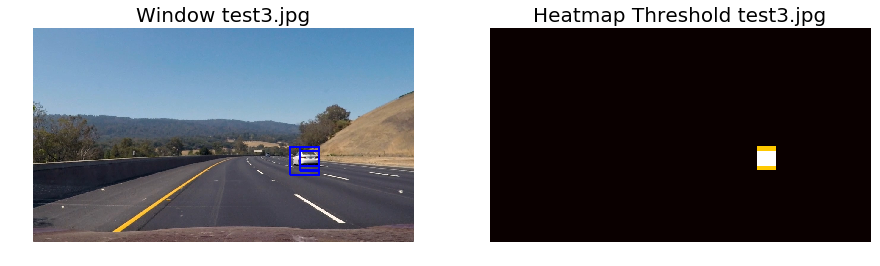

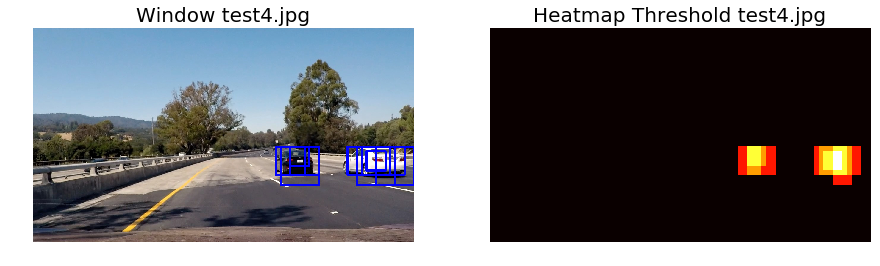

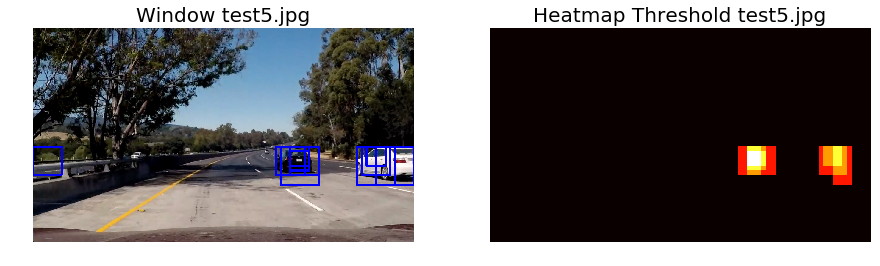

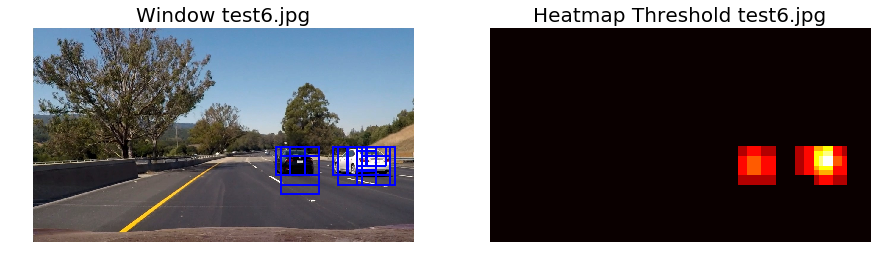

In [39]:
ystart = [400, 416, 400, 432, 400, 432, 400, 464]
ystop  = [464, 480, 496, 528, 528, 560, 596, 660]
scale  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.5, 3.5]

for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    windows = []

    for i in range(len(ystart)):
        windows.append(find_cars(image, ystart[i], ystop[i], scale[i], svc, X_scaler,
                                 color_space, spatial_size, hist_bins, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_feat, hist_feat))
    
    windows = [item for sublist in windows for item in sublist]
    
    window_img = draw_boxes(image, windows)
    
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    heatmap_img = add_heat(heatmap_img, windows)
    heatmap_thrsh_img = apply_threshold(heatmap_img, 1)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmap_thrsh_img, 0, 255)
    
    show_images(window_img, 'Window '+ filename, heatmap, 'Heatmap Threshold '+ filename, False, True)

### 5) Visualize SciPy Labels to Heatmap and Bounding Boxes for Lables


              In test1.jpg   In test2.jpg   In test3.jpg   In test4.jpg   In test5.jpg   In test6.jpg   
              ------------   ------------   ------------   ------------   ------------   ------------   
              2 cars found   0 cars found   1 car found    2 cars found   2 cars found   2 cars found   

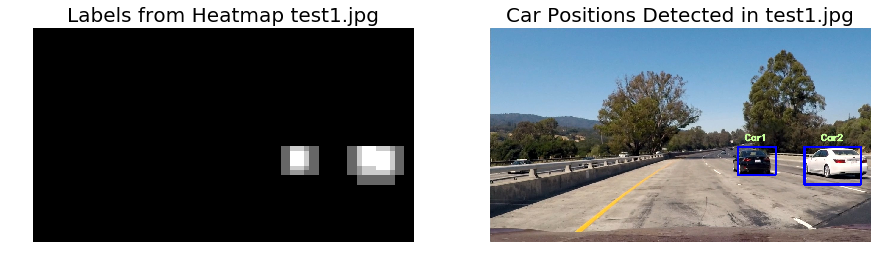

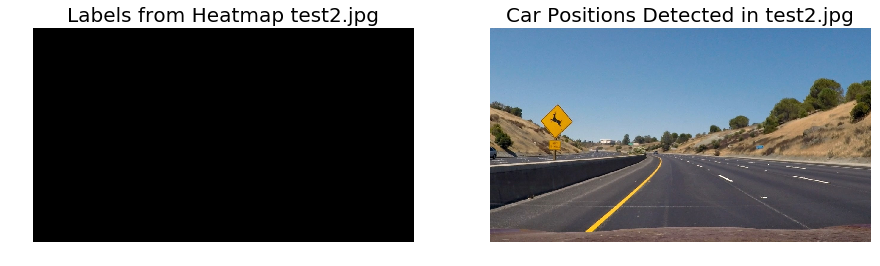

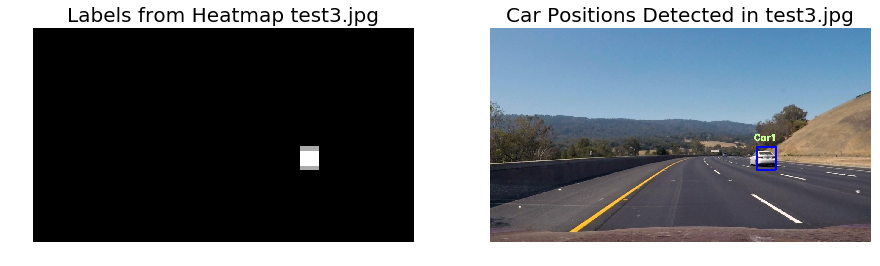

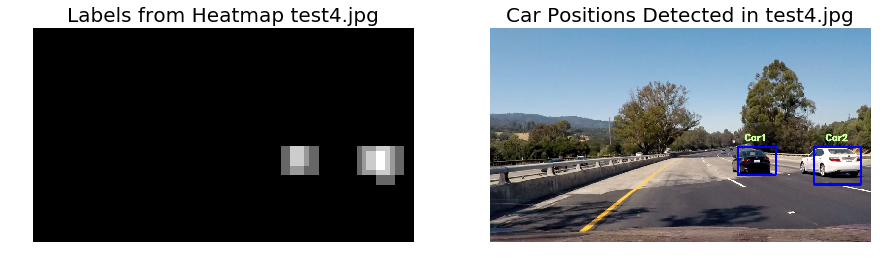

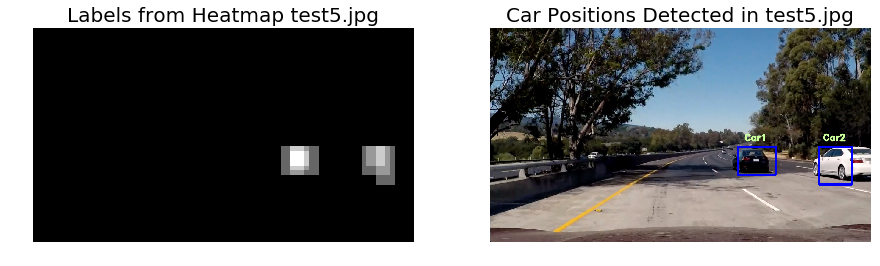

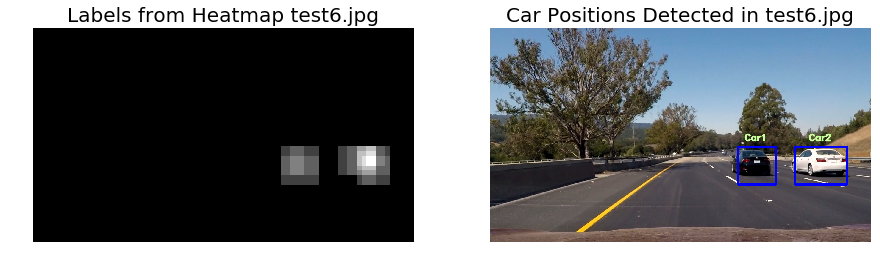

In [100]:
ystart = [400, 416, 400, 432, 400, 432, 400, 464]
ystop  = [464, 480, 496, 528, 528, 560, 596, 660]
scale  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.5, 3.5]

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    print('In', filename, end="   ")

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    print('------------', end="   ")

print()
print('             ', end=" ")
for path in test_images:
    dirname, filename = os.path.split(path)

    # Read in each image
    image = mpimg.imread(path)
    
    windows = []

    for i in range(len(ystart)):
        windows.append(find_cars(image, ystart[i], ystop[i], scale[i], svc, X_scaler,
                                 color_space, spatial_size, hist_bins, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_feat, hist_feat))
    
    windows = [item for sublist in windows for item in sublist]
    
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    heatmap_img = add_heat(heatmap_img, windows)
    heatmap_thrsh_img = apply_threshold(heatmap_img, 1)
    labels = label(heatmap_thrsh_img)
    if ((labels[1]) != 1):
        print(labels[1], 'cars found', end="   ")
    else:
        print(labels[1], 'car found ', end="   ")
    
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    show_images(heatmap_thrsh_img, 'Labels from Heatmap '+ filename, draw_img, 'Car Positions Detected in '+ filename)
    save_images(cv2.cvtColor(draw_img, cv2.COLOR_RGB2BGR), '2_Vehicles_Detected', filename)

## Step 6: Build Pipeline for Vehicle Detection on Test Videos

### a) The function `process_video()` processes each frame of the video without accounting for any information from previous frames.

In [41]:
def process_video(image):
    ystart = [400, 416, 400, 432, 400, 432, 400, 464]
    ystop  = [464, 480, 496, 528, 528, 560, 596, 660]
    scale  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.5, 3.5]

    windows = []
    
    for i in range(len(ystart)):
        windows.append(find_cars(image, ystart[i], ystop[i], scale[i], svc, X_scaler,
                                 color_space, spatial_size, hist_bins, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_feat, hist_feat))

    windows = [item for sublist in windows for item in sublist]
    
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    heatmap_img = add_heat(heatmap_img, windows)
    heatmap_thrsh_img = apply_threshold(heatmap_img, 1)
    labels = label(heatmap_thrsh_img)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    return draw_img

**Visualize `process_video()` on Test Video**

In [42]:
#my_clip.write_gif('test.gif', fps=12)
video_output1 = 'output_videos\project_test_video_output.mp4'
video_input1 = VideoFileClip('test_video.mp4')
processed_video = video_input1.fl_image(process_video)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video output_videos\project_test_video_output.mp4
[MoviePy] Writing video output_videos\project_test_video_output.mp4


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 38/39 [00:45<00:01,  1.31s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos\project_test_video_output.mp4 

Wall time: 47.2 s


In [43]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

### b) Define a Class to Store Data from Vehicle Detections

In [44]:
# Define a class to store data from video
class vehicle_detect():
    def __init__(self):
        # History of previous windows
        self.prev_windows = [] 
        
    def add_windows(self, windows):
        self.prev_windows.append(windows)
        if len(self.prev_windows) > 15:
            # Throw out oldest detected window set(s)
            self.prev_windows = self.prev_windows[len(self.prev_windows)-15:]

### c) The function `process_frame_for_video()` now processes each frame of the video accounting for information from previous frames.

In [45]:
def process_frame_for_video(image):
    ystart = [400, 416, 400, 432, 400, 432, 400, 464]
    ystop  = [464, 480, 496, 528, 528, 560, 596, 660]
    scale  = [1.0, 1.0, 1.5, 1.5, 2.0, 2.0, 3.5, 3.5]

    windows = []
    
    for i in range(len(ystart)):
        windows.append(find_cars(image, ystart[i], ystop[i], scale[i], svc, X_scaler,
                                 color_space, spatial_size, hist_bins, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_feat, hist_feat))

    windows = [item for sublist in windows for item in sublist]
    
    # add detections to the history
    if len(windows) > 0:
        det.add_windows(windows)
    
    heatmap_img = np.zeros_like(image[:,:,0]).astype(np.float)
    for window_set in det.prev_windows:
        heatmap_img = add_heat(heatmap_img, window_set)
    heatmap_thrsh_img = apply_threshold(heatmap_img,  1 + len(det.prev_windows)//2)
    labels = label(heatmap_thrsh_img)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    return draw_img

**Visualize `process_frame_for_video()` on Test Video**

In [46]:
det = vehicle_detect()

test_out_file2 = 'output_videos\project_test_video_output_2.mp4'
clip_test2 = VideoFileClip('test_video.mp4')
clip_test_out2 = clip_test2.fl_image(process_frame_for_video)
%time clip_test_out2.write_videofile(test_out_file2, audio=False)

[MoviePy] >>>> Building video output_videos\project_test_video_output_2.mp4
[MoviePy] Writing video output_videos\project_test_video_output_2.mp4


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 38/39 [00:48<00:01,  1.32s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos\project_test_video_output_2.mp4 

Wall time: 50.2 s


In [47]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file2))

**Visualize `process_frame_for_video()` on Project Video**

In [48]:
det = vehicle_detect()

proj_out_file = 'output_videos\project_video_output.mp4'
clip_proj = VideoFileClip('project_video.mp4')#.subclip(0,23)  # subclip = only specified span of video
#clip_proj.save_frame('./test_images/project1.jpg', t=1.0) # saves the frame at time = t seconds
clip_proj_out = clip_proj.fl_image(process_frame_for_video)
%time clip_proj_out.write_videofile(proj_out_file, audio=False)

[MoviePy] >>>> Building video output_videos\project_video_output.mp4
[MoviePy] Writing video output_videos\project_video_output.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [26:02<00:01,  1.30s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos\project_video_output.mp4 

Wall time: 26min 3s


In [49]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(proj_out_file))